<a href="https://colab.research.google.com/github/Himagination/GANs/blob/main/First_GAN_Generate_Handwritten_digits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

- Build and train a GAN(Generative Adversial Network) that can generate hand-written images of digits.
- Build the generator and discriminator components of GAN from scratch.
- Create Generator and Discriminator Loss function.
- Train your GAN and visualize the generated images.

## Import required Packages

In [ ]:
import torch
import torch.nn as nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [ ]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Utility function to visualize images

In [ ]:
def show_tensor_images(image_tensor, 
                       num_images=25, 
                       size=(1, 28, 28)):
  image_unflat = image_tensor.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], 
                         nrow=5)
  plt.imshow(image_grid.permute(1,2,0).squeeze())
  plt.show()

## Generator

- Create a function to make a single layer/block for Generator's Neural Network.
- Each Block should include a *Linear Transformation* to map to another shape, *batch_normalization* for stabilization, and a non-linear activation function.

In [ ]:
def get_generator_block(input_dim, output_dim):
  return nn.Sequential(
      nn.Linear(input_dim, output_dim), 
      nn.BatchNorm1d(output_dim), 
      nn.ReLU(inplace=True)
  )

**Generator Class**

Generator Class will take 3 values:

- The noise vector dimension.
- The image dimension.
- The initial hidden dimension.

Using above 3 values, the Generator will build a Neural Network with 5layers/blocks.

Beginning with Noise Vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted.

In [ ]:
class Generator(nn.Module):

  def __init__(self, 
               z_dim=10, 
               im_dim=784, 
               hidden_dim=128):
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        get_generator_block(z_dim, hidden_dim), 
        get_generator_block(hidden_dim, hidden_dim * 2), 
        get_generator_block(hidden_dim * 2, hidden_dim * 4), 
        get_generator_block(hidden_dim * 4, hidden_dim * 8), 
        nn.Linear(hidden_dim * 8, im_dim), 
        nn.Sigmoid()
    )

  def forward(self, noise):
    return self.gen(noise)

In [ ]:
def get_noise(n_samples, 
              z_dim, 
              device=DEVICE):
  return torch.randn(n_samples, 
                     z_dim).to(device)

## Discriminator

The Discriminator class holds 2 values:

- The Image dimension
- The Hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a 1 dimensional output. This output classifies whether an image is fake or real.

In [ ]:
def get_discriminator_block(input_dim, 
                            output_dim):
  return nn.Sequential(
      nn.Linear(input_dim, output_dim), 
      nn.LeakyReLU(0.2, inplace=True)
  )

In [ ]:
class Discriminator(nn.Module):

  def __init__(self, 
               im_dim=784, 
               hidden_dim=128):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        get_discriminator_block(im_dim, hidden_dim * 4), 
        get_discriminator_block(hidden_dim * 4, hidden_dim * 2), 
        get_discriminator_block(hidden_dim * 2, hidden_dim), 
        nn.Linear(hidden_dim, 1)
    )
  
  def forward(self, image):
    return self.disc(image)

## Training

- Set the parameters
- Load dataset as DataLoader
- Initialize generator, discriminator and optimizers
- Create functions to calculate the discriminator's loss and generator's loss

In [ ]:
# Set the parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 1e-5

In [ ]:
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()), 
    batch_size=batch_size, 
    shuffle=True
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
# Initialization
gen = Generator(z_dim).to(DEVICE)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(DEVICE)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
def get_disc_loss(gen, 
                  disc, 
                  criterion, 
                  real, 
                  num_images, 
                  z_dim, 
                  device):
  fake_noise = get_noise(num_images, z_dim, device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake.detach())
  disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
  disc_real_pred = disc(real)
  disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
  disc_loss = (disc_fake_loss + disc_real_loss) / 2
  return disc_loss

In [ ]:
def get_gen_loss(gen, 
                 disc, 
                 criterion, 
                 num_images, 
                 z_dim ,
                 device):
  fake_noise = get_noise(num_images, z_dim, device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake)
  gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
  return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator Loss: 1.5663603242635729 /n Discriminator Loss: 0.40306975245475773


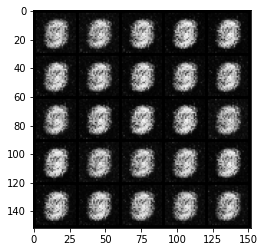

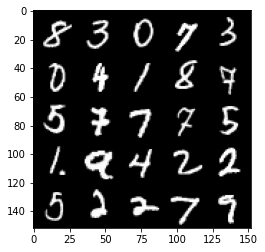

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator Loss: 3.513540700316427 /n Discriminator Loss: 0.6476779182553285


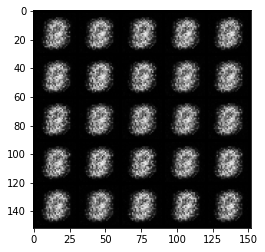

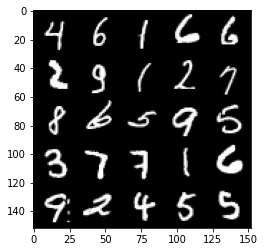

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator Loss: 5.8076878913640915 /n Discriminator Loss: 0.7795224643498654


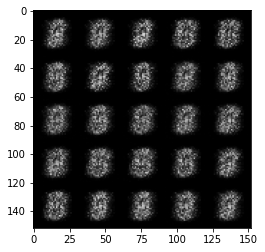

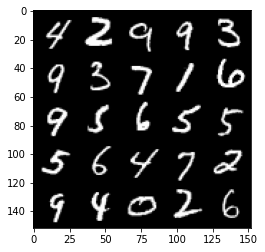

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator Loss: 7.65784557259083 /n Discriminator Loss: 0.9845592517107722


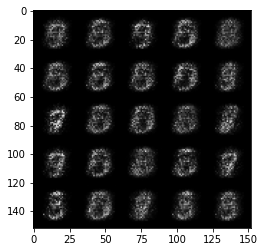

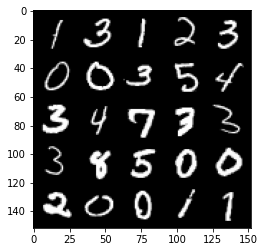

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator Loss: 9.277478918433177 /n Discriminator Loss: 1.220264066830279


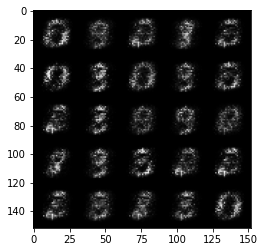

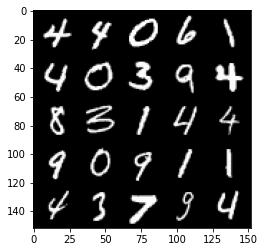

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator Loss: 11.195289697051033 /n Discriminator Loss: 1.3926198765039466


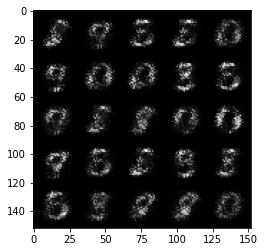

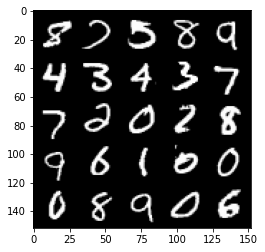

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator Loss: 13.504622471213324 /n Discriminator Loss: 1.5151082111746097


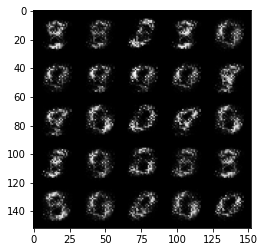

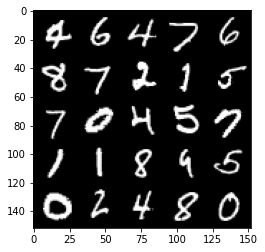

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator Loss: 16.312478747248633 /n Discriminator Loss: 1.6136634019017257


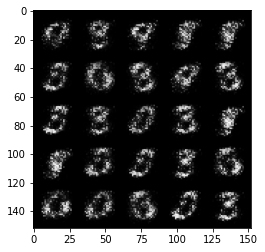

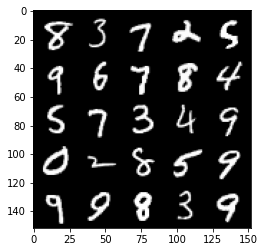

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator Loss: 19.45490640866753 /n Discriminator Loss: 1.70305357100815


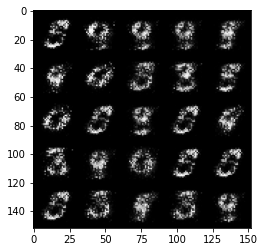

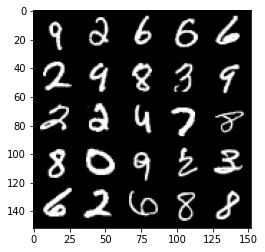

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator Loss: 22.781158406138374 /n Discriminator Loss: 1.7859216662496378


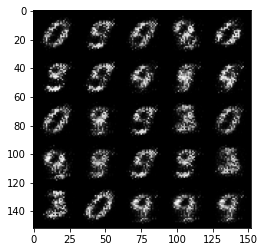

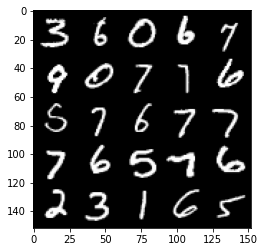

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator Loss: 26.275992693304982 /n Discriminator Loss: 1.852595597244803


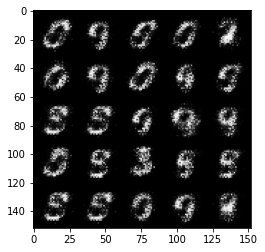

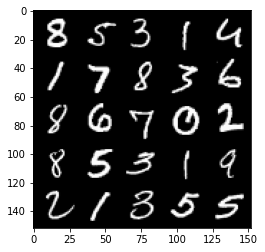

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator Loss: 30.046877633452375 /n Discriminator Loss: 1.916420320339505


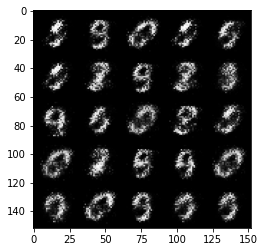

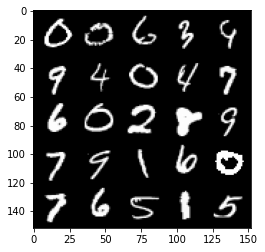

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator Loss: 33.869187140345524 /n Discriminator Loss: 1.9857551006972831


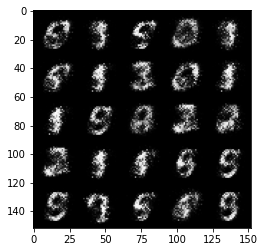

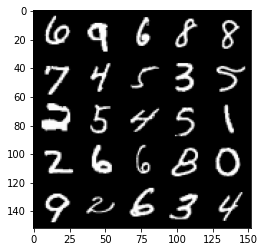

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator Loss: 37.761969199538115 /n Discriminator Loss: 2.053062050640586


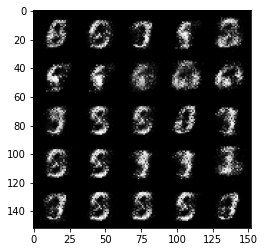

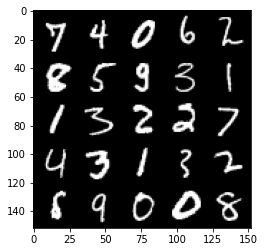

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator Loss: 41.805740185618276 /n Discriminator Loss: 2.1157823181226942


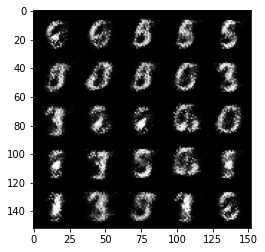

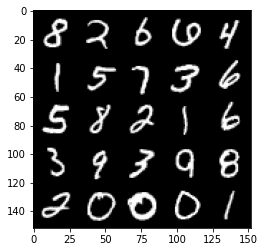

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator Loss: 45.79994061505782 /n Discriminator Loss: 2.178198594987403


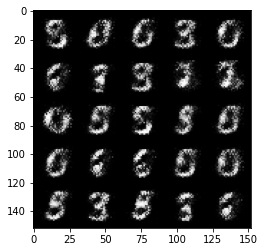

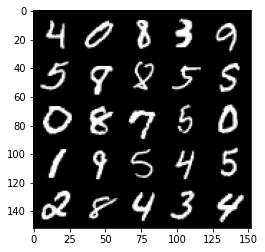

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator Loss: 49.849878127932485 /n Discriminator Loss: 2.236290179353215


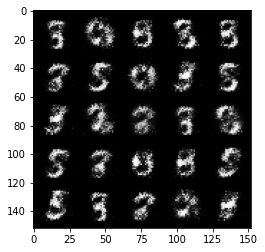

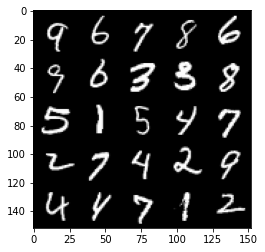

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator Loss: 53.761432815909345 /n Discriminator Loss: 2.294115351241091


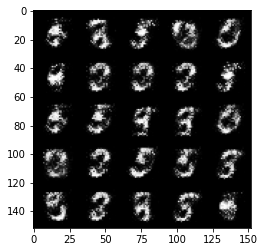

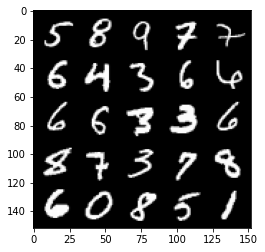

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator Loss: 57.96528829085819 /n Discriminator Loss: 2.3516885859370347


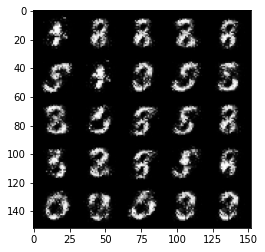

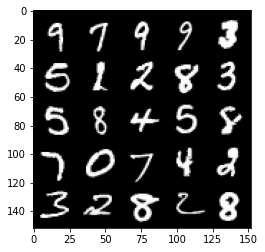

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator Loss: 62.079489085555046 /n Discriminator Loss: 2.408854751501244


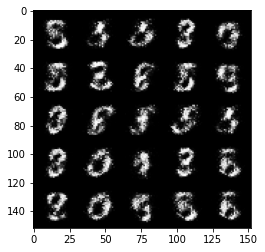

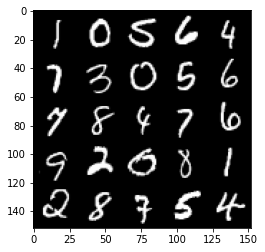

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator Loss: 66.03468332087995 /n Discriminator Loss: 2.472663558986048


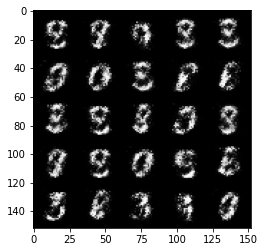

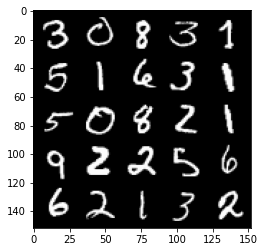

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator Loss: 70.15083716380605 /n Discriminator Loss: 2.5383065042048787


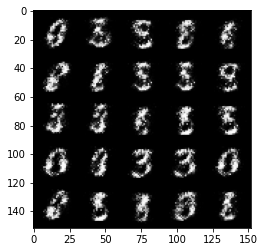

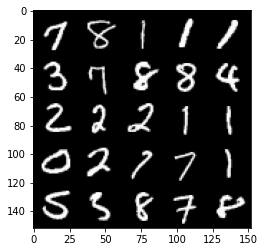

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator Loss: 74.21930494868754 /n Discriminator Loss: 2.6115307724587717


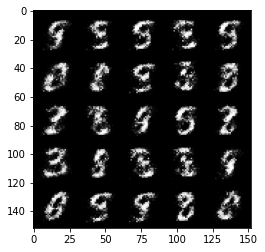

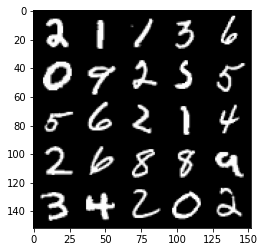

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator Loss: 78.16968762099746 /n Discriminator Loss: 2.680165232326841


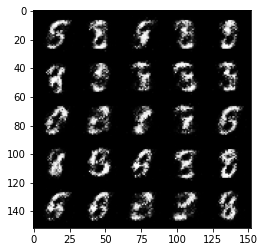

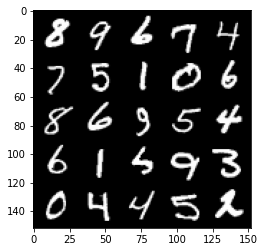

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator Loss: 82.11198305785668 /n Discriminator Loss: 2.750818910475824


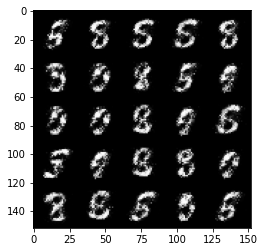

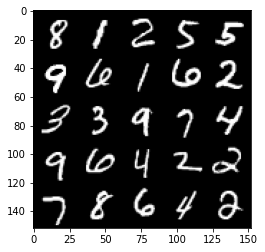

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator Loss: 85.9442980264428 /n Discriminator Loss: 2.8341136193834284


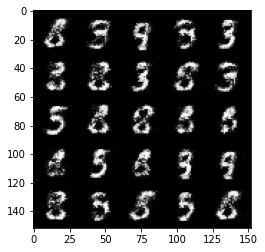

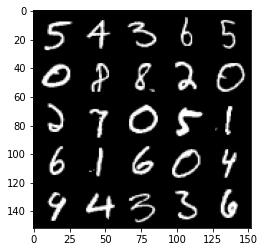

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator Loss: 89.74494159495868 /n Discriminator Loss: 2.9230461189933155


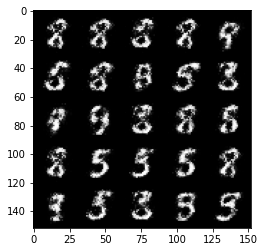

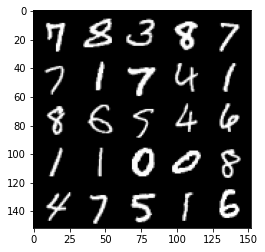

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator Loss: 93.7714216765169 /n Discriminator Loss: 3.003399046722806


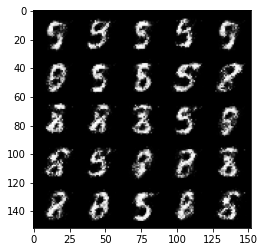

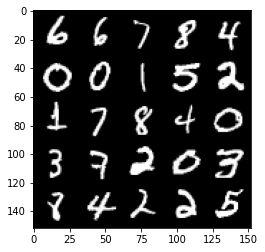

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator Loss: 97.67647551953826 /n Discriminator Loss: 3.0893800559677262


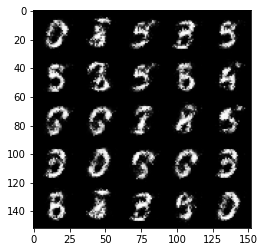

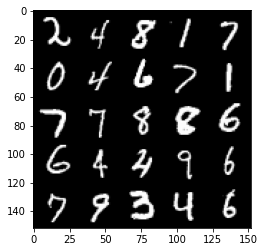

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator Loss: 101.6272063692811 /n Discriminator Loss: 3.181523285996177


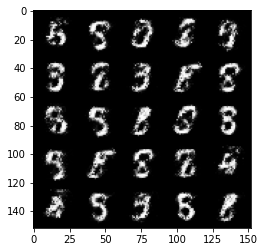

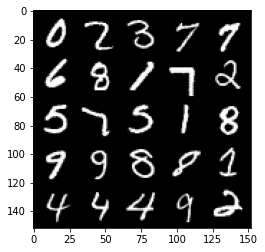

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator Loss: 105.4410515259506 /n Discriminator Loss: 3.2725164917893825


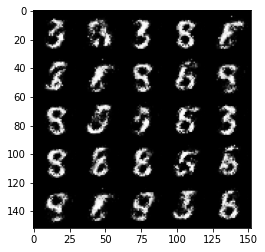

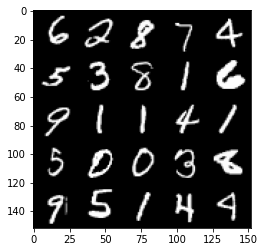

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator Loss: 109.11067050445104 /n Discriminator Loss: 3.3775845262818165


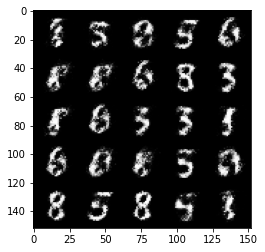

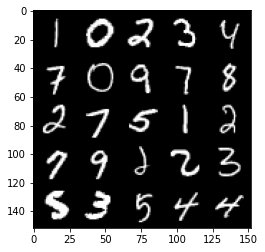

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator Loss: 112.7884789150956 /n Discriminator Loss: 3.4904062189869687


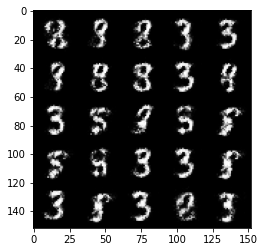

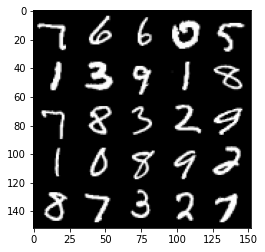

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator Loss: 116.39007818210165 /n Discriminator Loss: 3.609831427220268


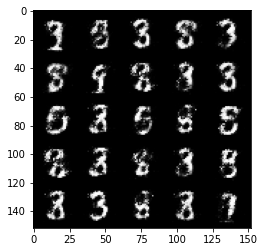

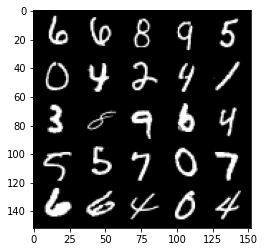

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator Loss: 119.92730637300058 /n Discriminator Loss: 3.7411119754649804


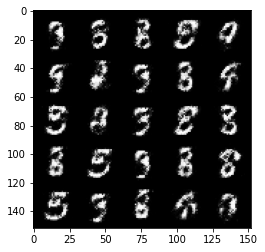

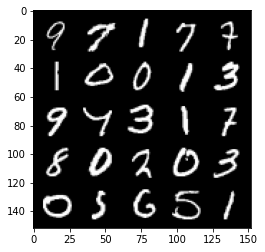

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator Loss: 123.55464136207148 /n Discriminator Loss: 3.8682885810770196


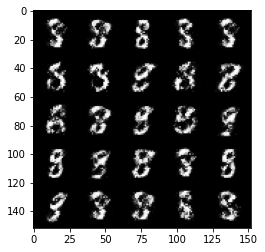

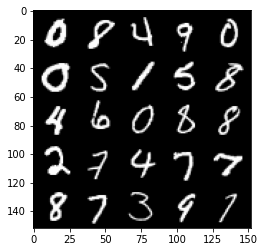

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator Loss: 127.19153572404437 /n Discriminator Loss: 3.9905334775112613


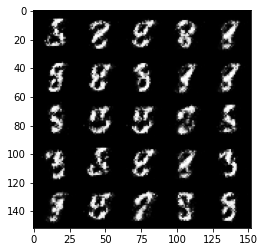

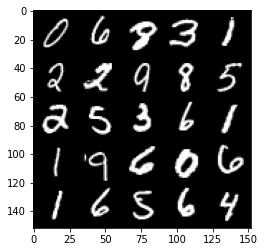

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator Loss: 130.78236684501235 /n Discriminator Loss: 4.120471426364033


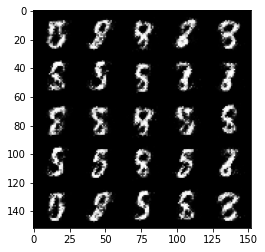

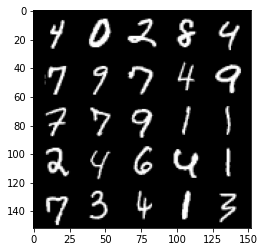

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator Loss: 134.29403091704893 /n Discriminator Loss: 4.264602604579173


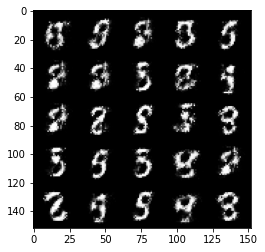

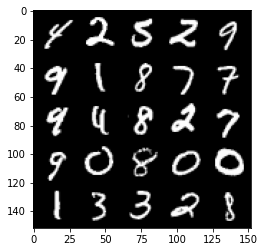

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator Loss: 137.5444325712921 /n Discriminator Loss: 4.439957942750302


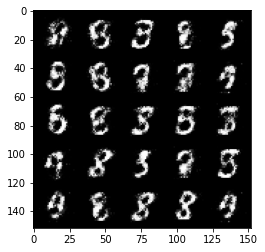

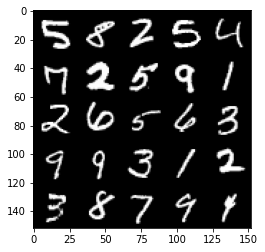

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator Loss: 140.8225634025338 /n Discriminator Loss: 4.57744045997784


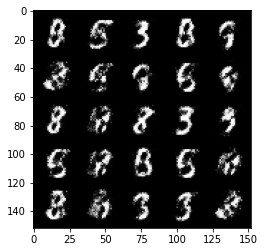

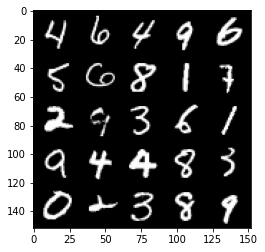

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator Loss: 144.24899036824755 /n Discriminator Loss: 4.712537702526903


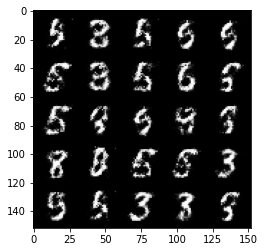

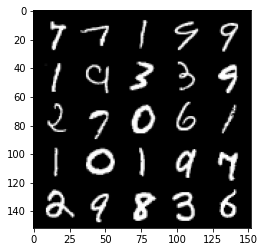

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator Loss: 147.69432875764426 /n Discriminator Loss: 4.856847544964407


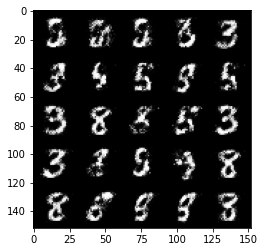

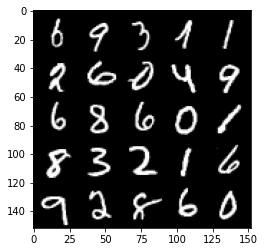

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator Loss: 151.0373745187524 /n Discriminator Loss: 5.022219423513851


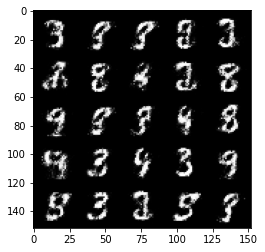

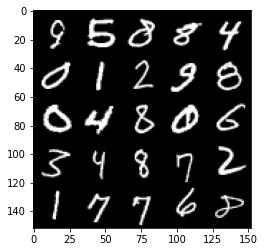

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator Loss: 154.3062669328455 /n Discriminator Loss: 5.187608708497137


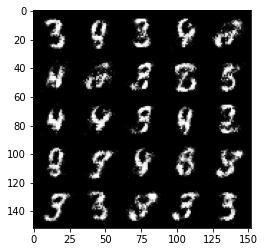

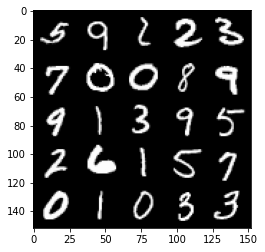

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator Loss: 157.45066965091272 /n Discriminator Loss: 5.381949944134812


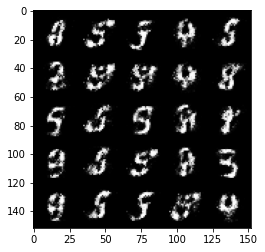

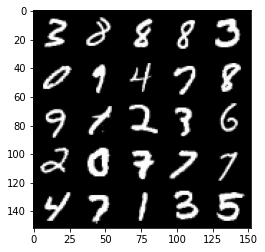

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator Loss: 160.74312961518828 /n Discriminator Loss: 5.537700755696755


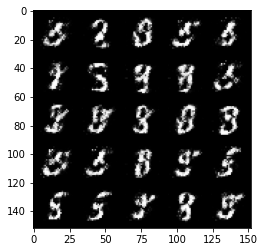

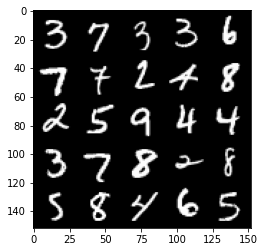

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator Loss: 163.9046021770245 /n Discriminator Loss: 5.72422685189174


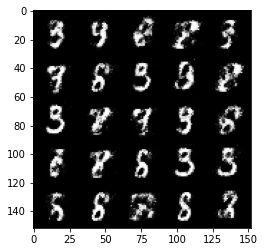

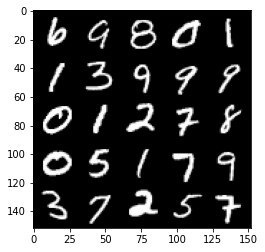

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator Loss: 166.95715326964935 /n Discriminator Loss: 5.910264149662125


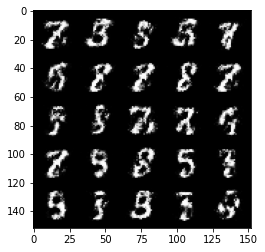

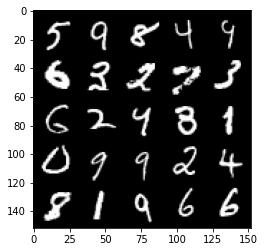

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator Loss: 169.90363488710017 /n Discriminator Loss: 6.092993123497842


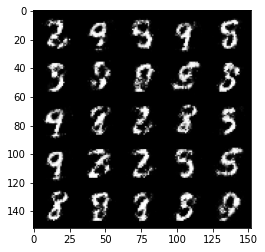

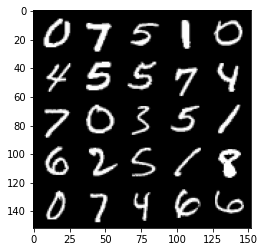

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator Loss: 172.9613435701139 /n Discriminator Loss: 6.279637558084008


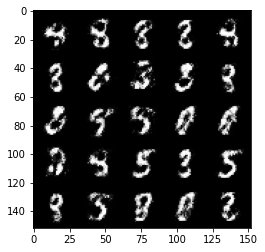

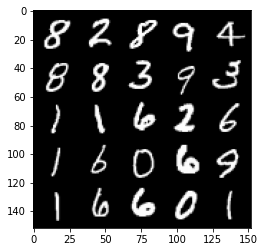

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator Loss: 175.9517881158593 /n Discriminator Loss: 6.473782393451806


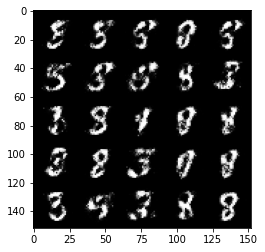

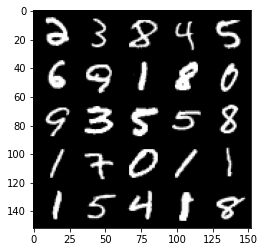

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator Loss: 178.79141726386575 /n Discriminator Loss: 6.6824019464813444


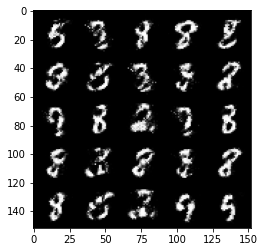

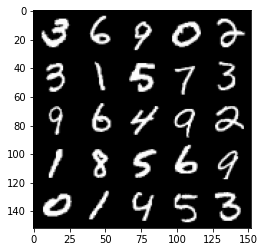

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator Loss: 181.7136412829163 /n Discriminator Loss: 6.8739627230726486


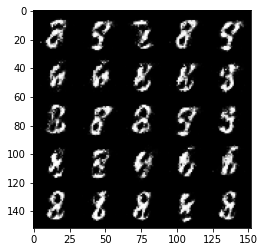

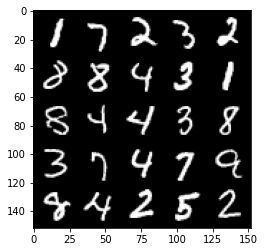

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator Loss: 184.55063108289272 /n Discriminator Loss: 7.083394693743469


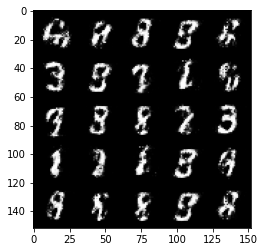

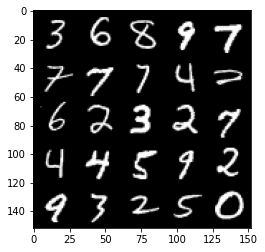

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator Loss: 187.3285786012414 /n Discriminator Loss: 7.306406902980094


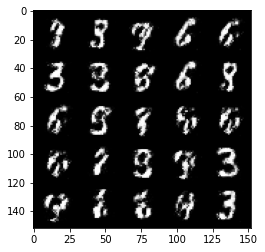

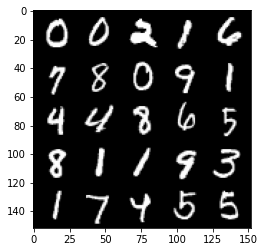

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator Loss: 190.08892600333726 /n Discriminator Loss: 7.531888319265134


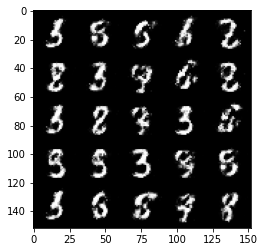

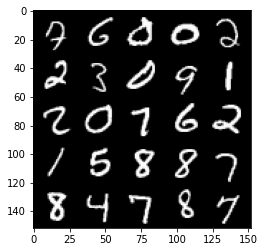

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator Loss: 192.6955835660701 /n Discriminator Loss: 7.786400060873523


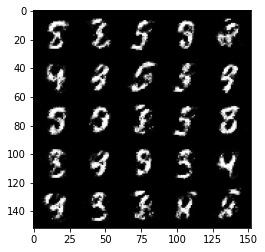

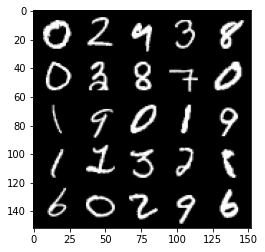

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator Loss: 195.25911649596762 /n Discriminator Loss: 8.032947654079692


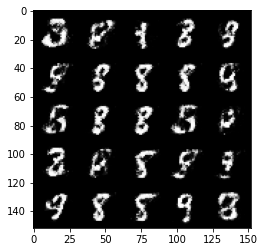

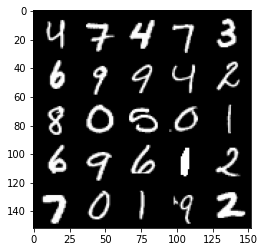

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator Loss: 197.91804586112568 /n Discriminator Loss: 8.265288806568874


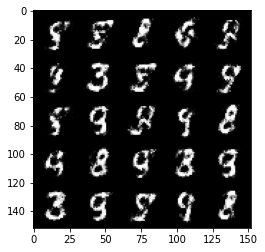

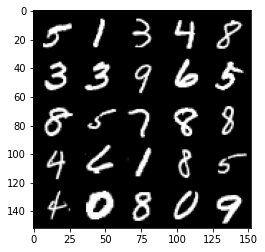

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator Loss: 200.64730032527567 /n Discriminator Loss: 8.491312548618815


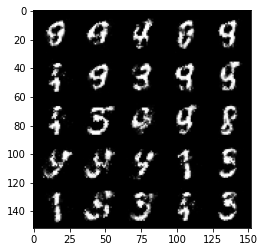

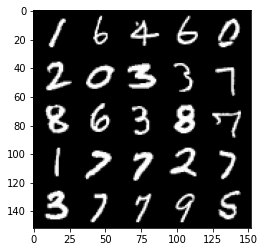

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator Loss: 203.31534577882363 /n Discriminator Loss: 8.730194148521921


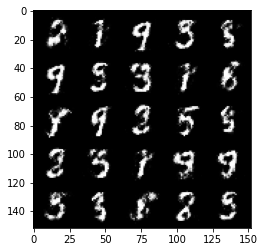

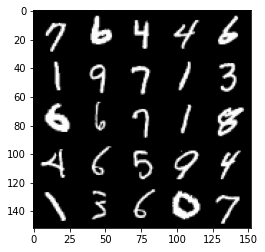

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator Loss: 205.93311144149388 /n Discriminator Loss: 8.966410289447795


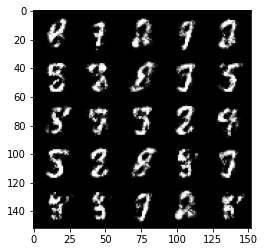

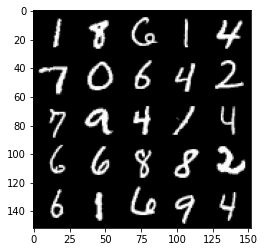

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator Loss: 208.57833928716283 /n Discriminator Loss: 9.211082470428241


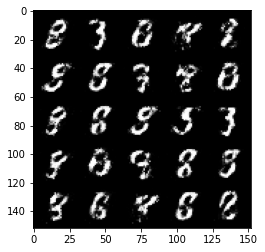

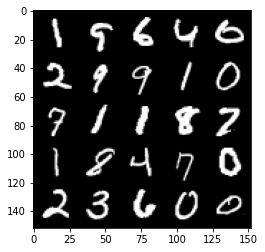

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator Loss: 211.1075119165193 /n Discriminator Loss: 9.45475840742519


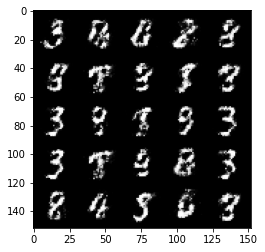

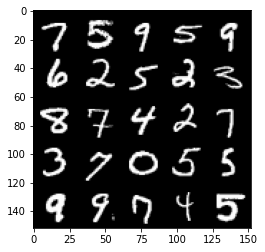

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator Loss: 213.71292133891706 /n Discriminator Loss: 9.706878031443846


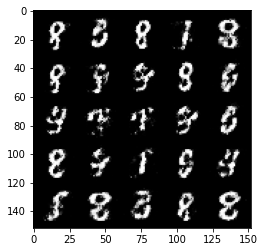

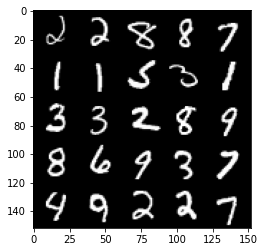

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator Loss: 216.24472515952692 /n Discriminator Loss: 9.97340075315166


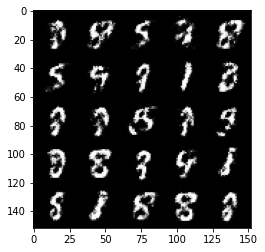

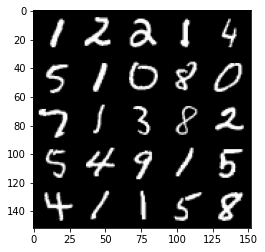

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator Loss: 218.7146221650846 /n Discriminator Loss: 10.238832506191011


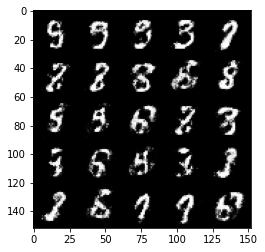

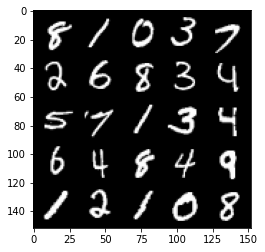

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator Loss: 221.1324671388871 /n Discriminator Loss: 10.509112256240115


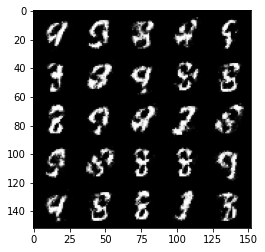

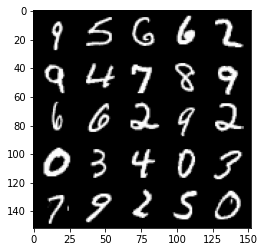

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator Loss: 223.49653732764793 /n Discriminator Loss: 10.790058467458946


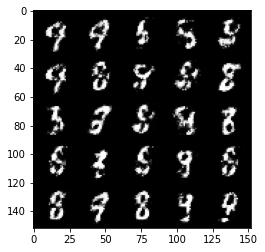

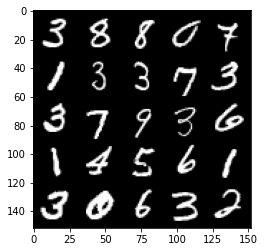

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator Loss: 225.82271660387596 /n Discriminator Loss: 11.073193306218853


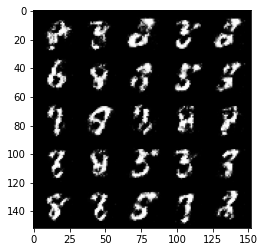

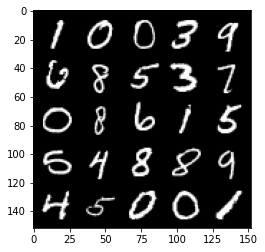

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator Loss: 228.26437709701145 /n Discriminator Loss: 11.346461479645233


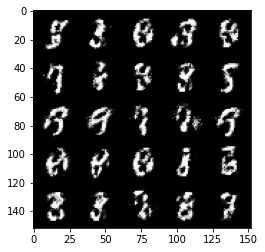

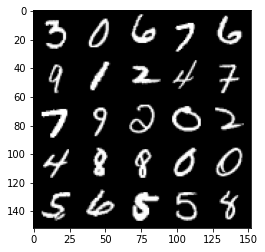

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator Loss: 230.61518489325135 /n Discriminator Loss: 11.618961034189931


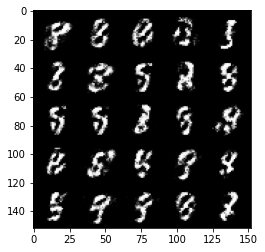

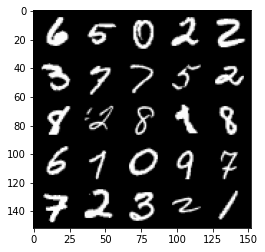

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator Loss: 232.98570973002992 /n Discriminator Loss: 11.903068972330564


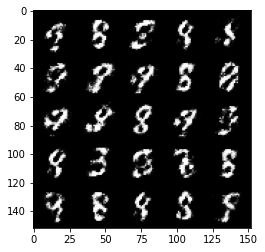

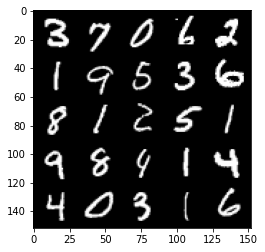

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator Loss: 235.26446092164582 /n Discriminator Loss: 12.200432479959002


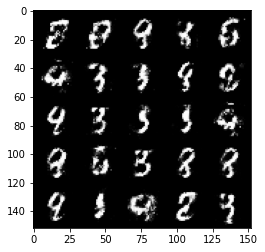

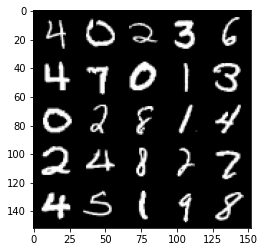

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator Loss: 237.5451622720968 /n Discriminator Loss: 12.493917939972158


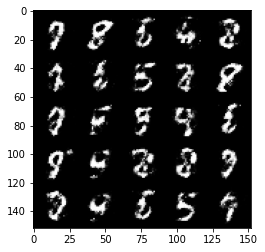

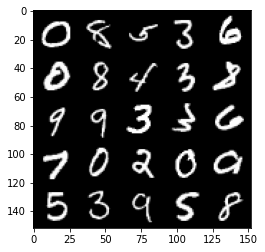

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator Loss: 239.78824778545 /n Discriminator Loss: 12.777907249998323


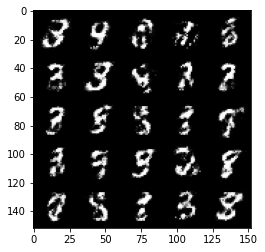

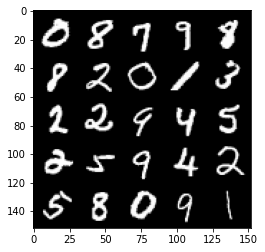

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator Loss: 242.0097392212162 /n Discriminator Loss: 13.083526473652594


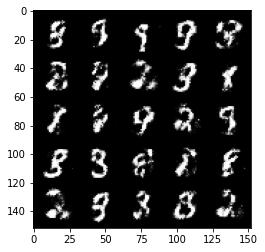

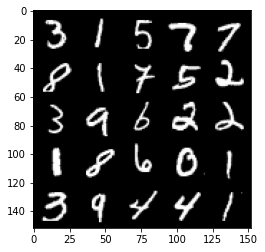

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator Loss: 244.1824878488788 /n Discriminator Loss: 13.39099175096677


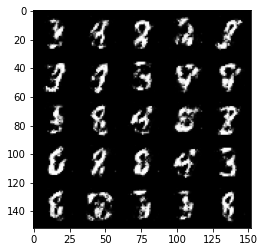

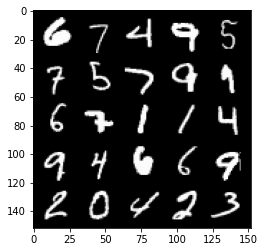

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator Loss: 246.3077098978768 /n Discriminator Loss: 13.711207835089416


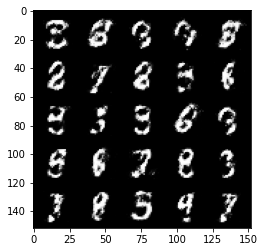

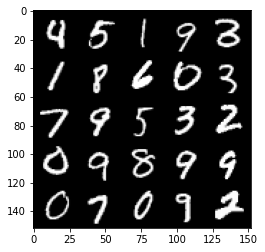

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator Loss: 248.46636602556836 /n Discriminator Loss: 14.004249019037934


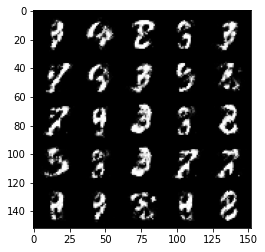

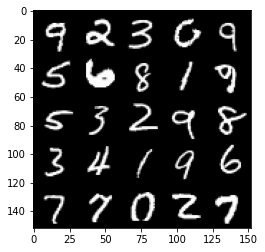

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator Loss: 250.63882618367788 /n Discriminator Loss: 14.29877895573899


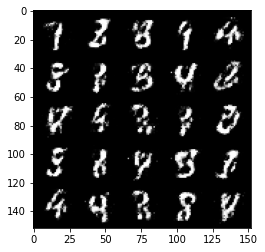

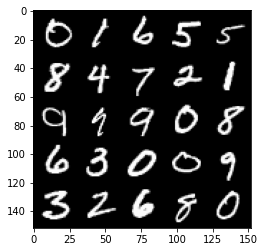

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator Loss: 252.8218284174211 /n Discriminator Loss: 14.591654815446592


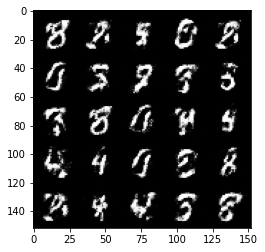

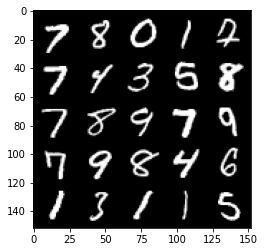

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator Loss: 254.90432648003136 /n Discriminator Loss: 14.910565037291505


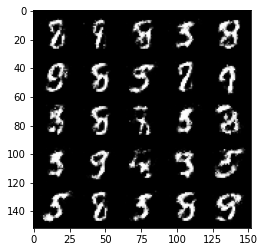

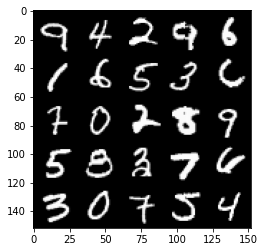

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator Loss: 257.0653511644606 /n Discriminator Loss: 15.223921064566802


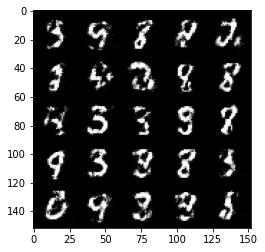

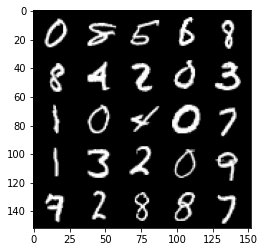

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator Loss: 259.16692493855953 /n Discriminator Loss: 15.543625940125429


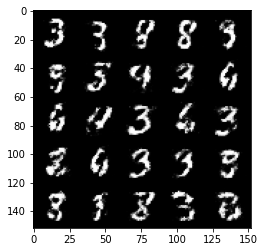

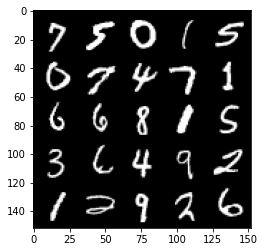

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator Loss: 261.292526412129 /n Discriminator Loss: 15.857859252821658


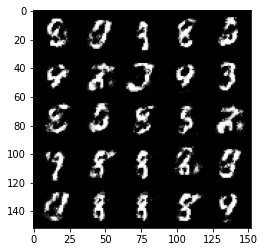

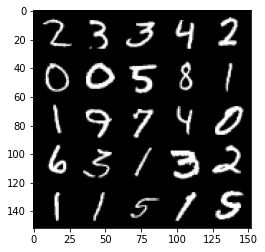

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator Loss: 263.38607704937436 /n Discriminator Loss: 16.185941610377274


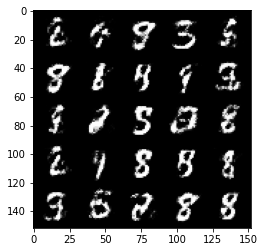

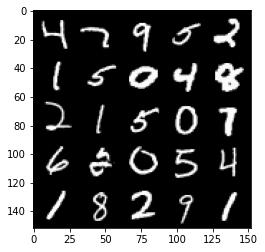

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator Loss: 265.49319465768366 /n Discriminator Loss: 16.48981378523632


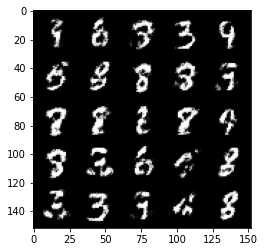

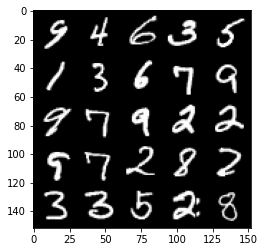

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator Loss: 267.6203322790861 /n Discriminator Loss: 16.7905243043415


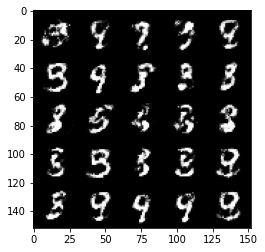

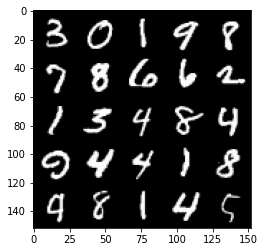

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator Loss: 269.5759455283879 /n Discriminator Loss: 17.146792362134896


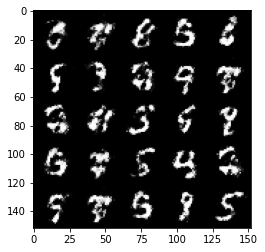

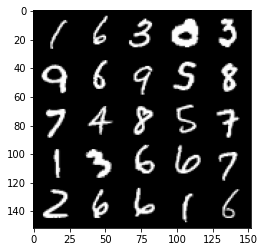

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator Loss: 271.63752174198646 /n Discriminator Loss: 17.46032585943862


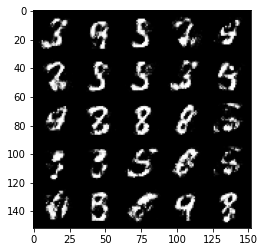

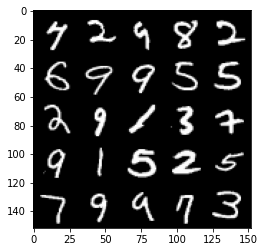

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator Loss: 273.7182381006482 /n Discriminator Loss: 17.786410150896767


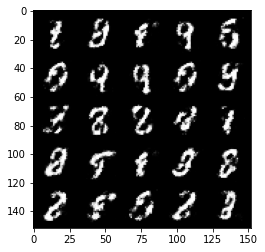

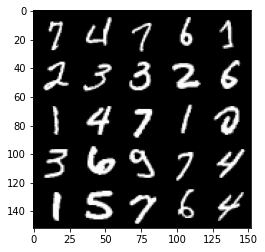

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator Loss: 275.69747501790533 /n Discriminator Loss: 18.120208466004584


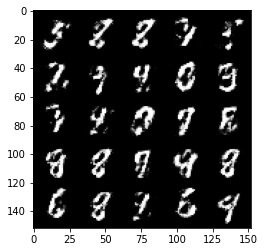

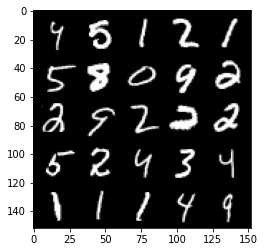

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator Loss: 277.7687586475611 /n Discriminator Loss: 18.429418424140625


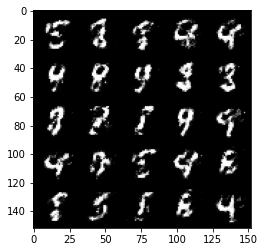

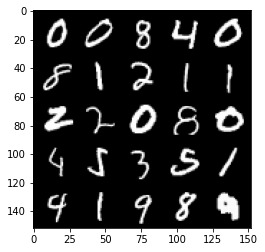

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator Loss: 279.8220143674613 /n Discriminator Loss: 18.74789396179835


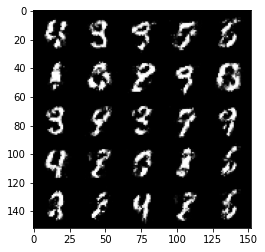

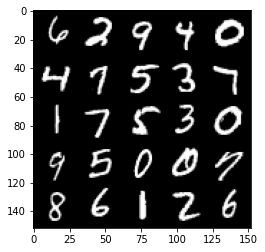

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator Loss: 281.8965881699326 /n Discriminator Loss: 19.06757557533306


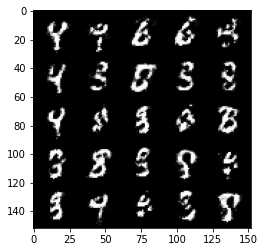

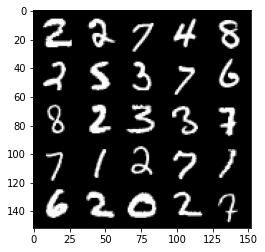

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator Loss: 283.87641315996717 /n Discriminator Loss: 19.399018385838676


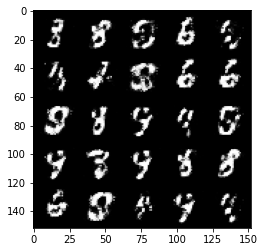

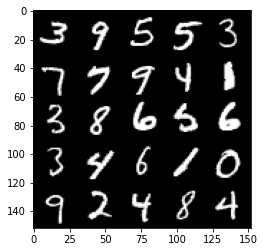

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator Loss: 285.9190945185436 /n Discriminator Loss: 19.725775532525


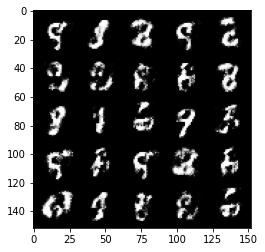

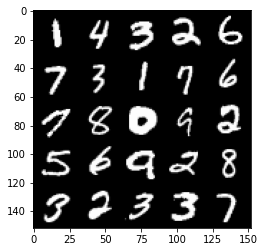

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator Loss: 287.8972061625732 /n Discriminator Loss: 20.057673809152035


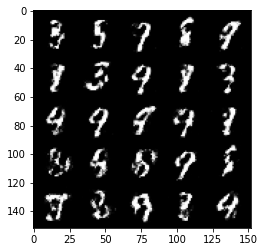

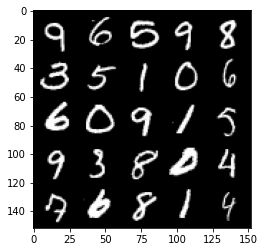

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator Loss: 289.87526976025146 /n Discriminator Loss: 20.3866789967827


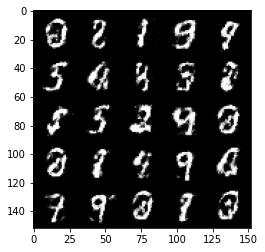

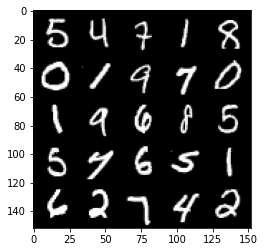

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator Loss: 291.8131355267769 /n Discriminator Loss: 20.73099977905674


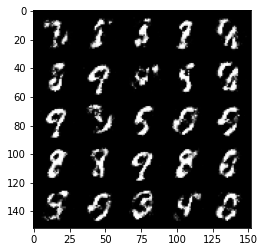

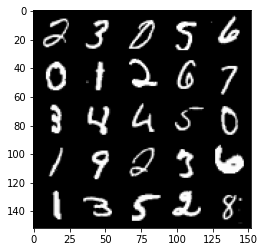

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator Loss: 293.7559481581458 /n Discriminator Loss: 21.07472367120905


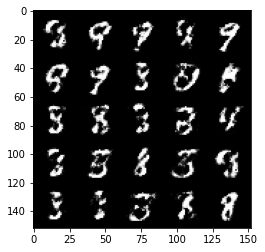

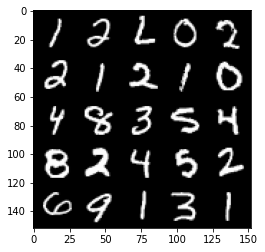

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator Loss: 295.768018498779 /n Discriminator Loss: 21.40674823836607


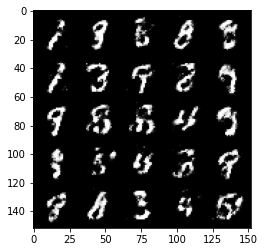

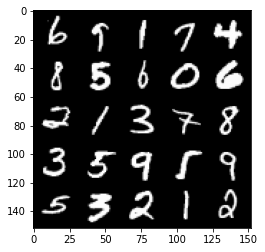

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator Loss: 297.7439831534631 /n Discriminator Loss: 21.752039085995406


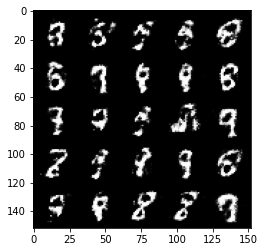

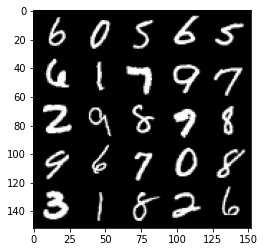

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator Loss: 299.6658170293572 /n Discriminator Loss: 22.09946747336912


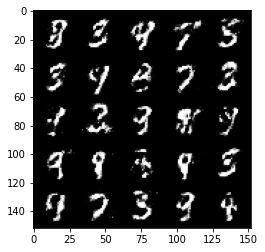

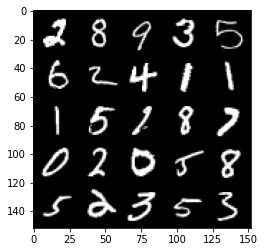

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator Loss: 301.6398437558417 /n Discriminator Loss: 22.43748854745553


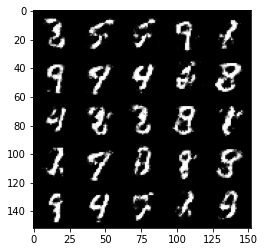

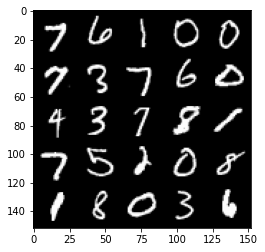

KeyboardInterrupt: ignored

In [ ]:
cur_step = 0
mean_gen_loss = 0
mean_disc_loss = 0
test_generator = True
gen_loss = False

for epoch in range(n_epochs):

  for real, _ in tqdm(dataloader):
    cur_batch_size = len(real)
    # Flatten the batch of real images from dataset
    real = real.view(cur_batch_size, -1).to(DEVICE)
    ## Update the discriminator ##
    # Zero out the gradients before backpropagation
    disc_opt.zero_grad()
    # Calculate discriminator loss
    disc_loss = get_disc_loss(gen, 
                              disc, 
                              criterion, 
                              real, 
                              cur_batch_size, 
                              z_dim, 
                              DEVICE)
    # Update gradients
    disc_loss.backward(retain_graph=True)
    # Update optimizer
    disc_opt.step()
    gen_opt.zero_grad()
    gen_loss = get_gen_loss(gen, 
                            disc, 
                            criterion, 
                            cur_batch_size, 
                            z_dim, 
                            DEVICE)
    gen_loss.backward()
    gen_opt.step()
    mean_disc_loss += disc_loss.item() / display_step
    mean_gen_loss += gen_loss.item() / display_step

    if cur_step % display_step == 0 and cur_step > 0:
      print(f"Step {cur_step}: Generator Loss: {mean_gen_loss} /n Discriminator Loss: {mean_disc_loss}")
      fake_noise = get_noise(cur_batch_size, z_dim, device=DEVICE)
      fake = gen(fake_noise)
      show_tensor_images(fake)
      show_tensor_images(real)
      mean_generator_loss = 0
      mean_discriminator_loss = 0
    cur_step += 1